In [1]:
from collections import defaultdict
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import sklearn
# Use Jaccard distance from this package
# Recall Jaccard_dist(A,B) = 1-Jaccard_similarity(A, B) 
import scipy.spatial.distance as spdist

import ihop
from ihop.community2vec import GensimCommunity2Vec
import ihop.clustering as ic

sns.set_palette("Dark2")
print(sns.color_palette("Dark2").as_hex())

['#1b9e77', '#d95f02', '#7570b3', '#e7298a', '#66a61e', '#e6ab02', '#a6761d', '#666666']


In [2]:

DATA_ROOT = Path("../data")
C2V_ROOT = DATA_ROOT / "community2vec"
VIZ_PATH = DATA_ROOT / "community2vec_nearest_neighbor_visuals"

if not VIZ_PATH.exists():
    VIZ_PATH.mkdir()

MONTHS = sorted(["2021-04", "2021-05", "2021-06", "2021-07", "2021-08", "2021-09", "2021-10", "2021-11", "2021-12", "2022-01", "2022-02", "2022-03"
])

C2V_MODELS = [GensimCommunity2Vec.load(C2V_ROOT / f"RC_{m}"/"best_model") for m in MONTHS]

SUBREDDIT_COUNTS_CSVS = [C2V_ROOT / f"RC_{m}" / "subreddit_counts.csv" for m in MONTHS]

In [3]:
def get_jaccard_similarity(set1, set2):
    intersection_size = len(set1.intersection(set2))
    if intersection_size == 0: 
        return 0
    union_size = len(set1.union(set2))
    return intersection_size / union_size


# Basic Inter-month Set Metrics
Determine which subreddits appear in EVERY MONTH in the dataset.

In [4]:
year_union = set()
year_intersection = set(C2V_MODELS[0].get_index_to_key())
for month_model in C2V_MODELS:
    month_subreddits = set(month_model.get_index_to_key())
    year_union = month_subreddits.union(year_union)
    year_intersection = month_subreddits.intersection(year_intersection)
print("Size of union over all months:", len(year_union))
print("Size of intersection over all months:", len(year_intersection))

Size of union over all months: 15292
Size of intersection over all months: 6950


In [5]:
# Some examples of the subreddits which appear in every month
for i, s in enumerate(year_intersection):
    print(s)
    if i>10:break

italy
Smite
MealPrepSunday
WormFanfic
ShermanPosting
Aquariums
outerwilds
SwingersPhilippines
ween
TransyTalk
MrRobot
TwoXIndia


# Measure the overall trends of nearest neighbor change and outlier detection
We'd like to know on average how much a subreddit's nearest neighbors change from one month to the next. Here we will fix the number of nearest neighbors to examine, then examine how each subreddits' neighbors change in adjacent months using Jaccard Similarity. We also use outlier detection to examine which subreddits are appear in dense sections of the embedding space, to see how that may relate to whether or not its nearest neighbors shift significantly.

In [6]:
k_nearest_neighbors = 20
similarity_tracking_df = pd.DataFrame(data={"subreddit":list(year_intersection)})
js_lof_association_matrix = np.empty((0,3))
jaccard_sim_cols = []
lof_cols=[]
prev_month=None

for month, c2v_model in zip(MONTHS, C2V_MODELS):
    this_month_nn_col = f"{month} {k_nearest_neighbors} nearest subreddits"
    similarity_tracking_df[this_month_nn_col] = similarity_tracking_df["subreddit"].apply(lambda x: set(c2v_model.get_nearest_neighbors(x, topn=k_nearest_neighbors)))

    lof_month_col = f"{month} local outlier factor"
    # Compute outlier scores for this month's snapshot
    lof_clf = sklearn.neighbors.LocalOutlierFactor(n_neighbors = 20, metric="cosine", n_jobs=-1)
    outlier_scores = lof_clf.fit_predict(c2v_model.get_normed_vectors())

    # Add subreddit's outlier score to dataframe
    subreddit_indices = c2v_model.get_index_to_key()
    similarity_tracking_df[lof_month_col] = similarity_tracking_df["subreddit"].apply(lambda x: outlier_scores[subreddit_indices.index(x)])

    lof_cols.append(lof_month_col)

    if prev_month is not None:
        prev_month_nn_col = f"{prev_month} {k_nearest_neighbors} nearest subreddits"
        prev_month_lof_col = f"{prev_month} local outlier factor"
        js_col_name = f"{month} vs {prev_month} Jaccard Similiarity"
        lof_pairwise_col_name = f"{month} vs {prev_month} avg Local Outlier Factor"

        def js_with_specific_cols(row):
            return get_jaccard_similarity(
                row[this_month_nn_col], 
                row[prev_month_nn_col])

        similarity_tracking_df[js_col_name] = similarity_tracking_df.apply(js_with_specific_cols, axis=1)
        jaccard_sim_cols.append(js_col_name)

        similarity_tracking_df[lof_pairwise_col_name] = similarity_tracking_df[[lof_month_col, prev_month_lof_col]].mean(axis=1)

        js_lof_association_matrix = np.concatenate([js_lof_association_matrix, similarity_tracking_df[["subreddit", js_col_name, lof_pairwise_col_name]].to_numpy()], axis=0)


    prev_month=month

In [7]:
js_lof_association_df = pd.DataFrame(js_lof_association_matrix, columns=["subreddit", "pairwise month Jaccard Similarity", "pairwise month average Local Outlier Factor"])
print(js_lof_association_df.shape)
display(js_lof_association_df.head())

(76450, 3)


,subreddit,pairwise month Jaccard Similarity,pairwise month average Local Outlier Factor
0,italy,0.37931,1.0
1,Smite,0.176471,1.0
2,MealPrepSunday,0.538462,1.0
3,WormFanfic,0.6,1.0
4,ShermanPosting,0.428571,1.0


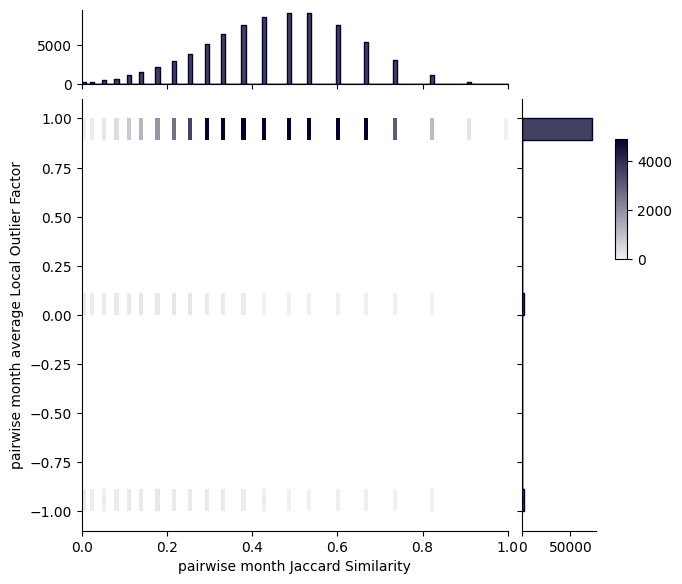

In [8]:
g = sns.JointGrid(data = js_lof_association_df, x="pairwise month Jaccard Similarity", y="pairwise month average Local Outlier Factor", marginal_ticks=True, xlim=(0,1))

cax = g.figure.add_axes([1.0, .55, .02, .2])
g.plot_joint(
    sns.histplot,
    cmap="light:#03012d", pmax=.25, cbar=True, cbar_ax=cax
)
g.plot_marginals(sns.histplot, element="step", color="#03012d")

In [9]:
js_avg_col = f"Jaccard Similarity between {k_nearest_neighbors} nearest neighbors of adjacent months averaged over the year"
js_stddev_col = "stddev Jaccard Similarity between adjacent months over the year"
similarity_tracking_df[js_avg_col] = similarity_tracking_df[jaccard_sim_cols].mean(axis=1)

similarity_tracking_df[js_stddev_col] = similarity_tracking_df[jaccard_sim_cols].std(axis=1)

In [10]:
jaccard_similarity_tracking_df = similarity_tracking_df.sort_values(by=[js_avg_col])
jaccard_similarity_tracking_df

,subreddit,2021-04 20 nearest subreddits,2021-04 local outlier factor,2021-05 20 nearest subreddits,2021-05 local outlier factor,2021-05 vs 2021-04 Jaccard Similiarity,2021-05 vs 2021-04 avg Local Outlier Factor,2021-06 20 nearest subreddits,2021-06 local outlier factor,2021-06 vs 2021-05 Jaccard Similiarity,...,2022-02 20 nearest subreddits,2022-02 local outlier factor,2022-02 vs 2022-01 Jaccard Similiarity,2022-02 vs 2022-01 avg Local Outlier Factor,2022-03 20 nearest subreddits,2022-03 local outlier factor,2022-03 vs 2022-02 Jaccard Similiarity,2022-03 vs 2022-02 avg Local Outlier Factor,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,stddev Jaccard Similarity between adjacent months over the year
5859,newsNepal,"{FostTalicska, TumblrInAction, Helicopters, Me...",-1,"{JuiceWRLD, MBA, MLA_Official, charmed, Minecr...",-1,0.00000,-1.0,"{isfp, goodmythicalmorning, HotPeppers, transp...",-1,0.000000,...,"{ArizonaGoneXXXtraWild, grilling, ravens, SubS...",-1,0.000000,-1.0,"{synthesizercirclejerk, bassnectar, seattlehob...",-1,0.000000,-1.0,0.000000,0.000000
1298,SubSimulatorGPT2,"{CenturyOfBlood, minicrewmatelove, SocialSigan...",1,"{malaysia, mississauga, RushRoyale, AdmiralBul...",-1,0.00000,0.0,"{Denton, tories, Gemini, actuary, udub, psx, t...",-1,0.000000,...,"{MalaysianPF, lincoln, Forex, SNDL, thinkorswi...",-1,0.000000,-1.0,"{InfluencergossipDK, Pocket7Games, TheSantaAna...",1,0.000000,0.0,0.000000,0.000000
2596,CelebbattlePolls,"{Fedexers, myanmar, FFRecordKeeper, iBUYPOWER,...",-1,"{JustUnsubbed, holesome, Im15AndThisIsYeet, co...",-1,0.00000,-1.0,"{iOSBeta, Svenska, Airpodsmax, SocialSiganls, ...",-1,0.000000,...,"{PantiesCraze, FrenchGoneWild, fatherjohnmisty...",-1,0.000000,-1.0,"{EndlessWar, ShermanPosting, chomsky, Resident...",-1,0.000000,-1.0,0.000000,0.000000
2907,OzBargainNew,"{Dashcam, Shitty_Car_Mods, Cartalk, namethatca...",1,"{AmericanFascism2020, GxbyMxrtinez, The_ASSylu...",-1,0.00000,0.0,"{cyprus, rva, Spokane, ems, Columbus, Boobies,...",-1,0.000000,...,"{growtopia, PetMice, The_Crew, KatarinaMains, ...",-1,0.000000,-1.0,"{VVVVVV, raocflair, BotTown2, The_Mueller, pai...",-1,0.000000,-1.0,0.000000,0.000000
2159,viral,"{ShoppingDealsOnline, ThingsCutInHalfPorn, Den...",-1,"{PolyBaddies, GxbyMxrtinez, UpvotedBecauseBoob...",-1,0.00000,-1.0,"{youtubepromotion, Youtubeviews, TheSantaAnaWi...",-1,0.000000,...,"{robotics, Volvo, EngineBuilding, NorsePaganis...",-1,0.000000,-1.0,"{VVVVVV, raocflair, SeenOnNews_longtail, OzBar...",-1,0.000000,-1.0,0.002331,0.007731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4883,readwithme,"{TheArtistStudio, RedditSessions, shortcircuit...",1,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.73913,1.0,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,...,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,1.0,"{TheArtistStudio, redditsweats, RedditSessions...",1,1.000000,1.0,0.815803,0.101704
6518,RedditSessions,"{TheArtistStudio, shortcircuit, RedditMasterCl...",1,"{TheArtistStudio, redditsweats, shortcircuit, ...",1,0.73913,1.0,"{TheArtistStudio, redditsweats, Haywire_Hill, ...",1,0.818182,...,"{TheArtistStudio, redditsweats, Haywire_Hill, ...",1,0.904762,1.0,"{TheArtistStudio, redditsweats, Haywire_Hill, ...",1,0.904762,1.0,0.821707,0.085387
4236,TheArtistStudio,"{RedditSessions, BadArt, RedditMasterClasses, ...",1,"{redditsweats, RedditSessions, photomath, Hayw...",1,0.60000,1.0,"{redditsweats, RedditSessions, Haywire_Hill, s...",1,0.818182,...,"{redditsweats, RedditSessions, Haywire_Hill, G...",1,0.904762,1.0,"{redditsweats, RedditSessions, Haywire_Hill, G...",1,0.904762,1.0,0.823329,0.098636
1452,TheYouShow,"{TheArtistStudio, RedditSessions, shortcircuit...",1,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.73913,1.0,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,...,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,1.0

In [11]:
mean_js = jaccard_similarity_tracking_df[js_avg_col].mean()
stddev_js = jaccard_similarity_tracking_df[js_avg_col].std()
stdev_upper = mean_js + stddev_js
stddev_lower = mean_js - stddev_js
print("Mean", mean_js)
print("1 stddev above", stdev_upper)
print("1 stddev below", stddev_lower)

Mean 0.4357252983675287
1 stddev above 0.5868815064397986
1 stddev below 0.2845690902952588


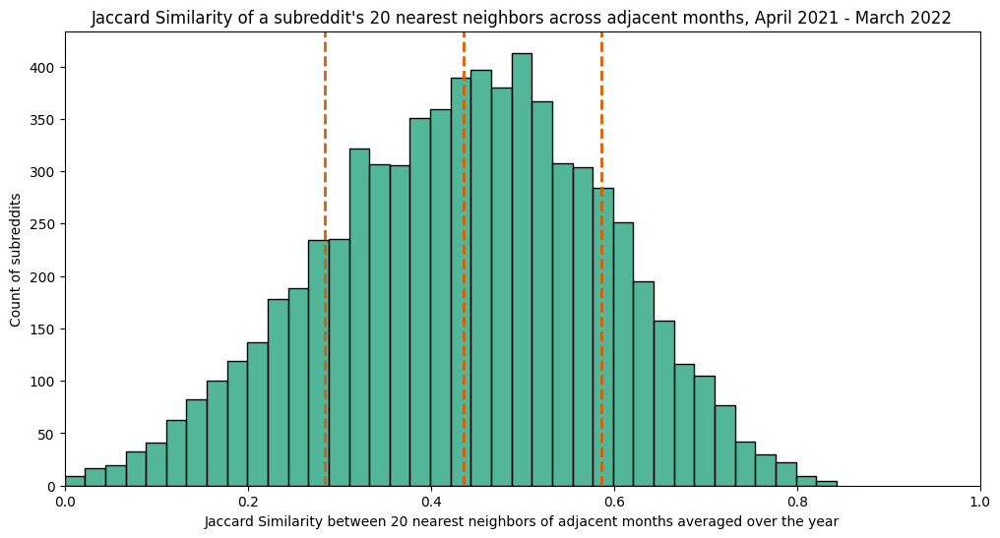

<Figure size 640x480 with 0 Axes>

In [12]:
plt.figure(figsize=(12,6))
ax = sns.histplot(data=jaccard_similarity_tracking_df, x=js_avg_col)
ax.set(ylabel="Count of subreddits", title = f"Jaccard Similarity of a subreddit's {k_nearest_neighbors} nearest neighbors across adjacent months, April 2021 - March 2022")
plt.xlim(0, 1)
plt.axvline(x = mean_js, color="#d95f02", linestyle="--", linewidth=2)
plt.axvline(x = stdev_upper, color="#d95f02", linestyle="--", linewidth=2)
plt.axvline(x = stddev_lower, color="#d95f02", linestyle="--", linewidth=2)
plt.show()
plt.clf()

In [13]:
# Which are the LEAST stable subreddits in terms of nearest neighbors? 
subreddits_with_lowest_avg_js = jaccard_similarity_tracking_df.head(int(0.1 * len(year_intersection)))
lowest_avg_js_subreddits = list(subreddits_with_lowest_avg_js["subreddit"])
print("Subreddits with lowest avg. Jaccard Similarity:")
for i in range(1, 25):
    j = len(year_intersection) - i + 1 
    print(j, ":", lowest_avg_js_subreddits[i-1])
display(subreddits_with_lowest_avg_js)

Subreddits with lowest avg. Jaccard Similarity:
6950 : newsNepal
6949 : SubSimulatorGPT2
6948 : CelebbattlePolls
6947 : OzBargainNew
6946 : viral
6945 : EmpiresAndPuzzles
6944 : NYr4r
6943 : BaltimoreAndDCr4r
6942 : sherwinwilliams
6941 : RiseofKingdoms
6940 : SexDolls
6939 : GolfClash
6938 : chicagor4r
6937 : SubredditSummaryBot
6936 : hookah
6935 : HeroWarsApp
6934 : BrasilSimulator
6933 : test
6932 : ShadowBan
6931 : GBr4r
6930 : OrnaRPG
6929 : ShoppingDealsOnline
6928 : PickOne
6927 : 8BallPool


,subreddit,2021-04 20 nearest subreddits,2021-04 local outlier factor,2021-05 20 nearest subreddits,2021-05 local outlier factor,2021-05 vs 2021-04 Jaccard Similiarity,2021-05 vs 2021-04 avg Local Outlier Factor,2021-06 20 nearest subreddits,2021-06 local outlier factor,2021-06 vs 2021-05 Jaccard Similiarity,...,2022-02 20 nearest subreddits,2022-02 local outlier factor,2022-02 vs 2022-01 Jaccard Similiarity,2022-02 vs 2022-01 avg Local Outlier Factor,2022-03 20 nearest subreddits,2022-03 local outlier factor,2022-03 vs 2022-02 Jaccard Similiarity,2022-03 vs 2022-02 avg Local Outlier Factor,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,stddev Jaccard Similarity between adjacent months over the year
5859,newsNepal,"{FostTalicska, TumblrInAction, Helicopters, Me...",-1,"{JuiceWRLD, MBA, MLA_Official, charmed, Minecr...",-1,0.000000,-1.0,"{isfp, goodmythicalmorning, HotPeppers, transp...",-1,0.000000,...,"{ArizonaGoneXXXtraWild, grilling, ravens, SubS...",-1,0.000000,-1.0,"{synthesizercirclejerk, bassnectar, seattlehob...",-1,0.000000,-1.0,0.000000,0.000000
1298,SubSimulatorGPT2,"{CenturyOfBlood, minicrewmatelove, SocialSigan...",1,"{malaysia, mississauga, RushRoyale, AdmiralBul...",-1,0.000000,0.0,"{Denton, tories, Gemini, actuary, udub, psx, t...",-1,0.000000,...,"{MalaysianPF, lincoln, Forex, SNDL, thinkorswi...",-1,0.000000,-1.0,"{InfluencergossipDK, Pocket7Games, TheSantaAna...",1,0.000000,0.0,0.000000,0.000000
2596,CelebbattlePolls,"{Fedexers, myanmar, FFRecordKeeper, iBUYPOWER,...",-1,"{JustUnsubbed, holesome, Im15AndThisIsYeet, co...",-1,0.000000,-1.0,"{iOSBeta, Svenska, Airpodsmax, SocialSiganls, ...",-1,0.000000,...,"{PantiesCraze, FrenchGoneWild, fatherjohnmisty...",-1,0.000000,-1.0,"{EndlessWar, ShermanPosting, chomsky, Resident...",-1,0.000000,-1.0,0.000000,0.000000
2907,OzBargainNew,"{Dashcam, Shitty_Car_Mods, Cartalk, namethatca...",1,"{AmericanFascism2020, GxbyMxrtinez, The_ASSylu...",-1,0.000000,0.0,"{cyprus, rva, Spokane, ems, Columbus, Boobies,...",-1,0.000000,...,"{growtopia, PetMice, The_Crew, KatarinaMains, ...",-1,0.000000,-1.0,"{VVVVVV, raocflair, BotTown2, The_Mueller, pai...",-1,0.000000,-1.0,0.000000,0.000000
2159,viral,"{ShoppingDealsOnline, ThingsCutInHalfPorn, Den...",-1,"{PolyBaddies, GxbyMxrtinez, UpvotedBecauseBoob...",-1,0.000000,-1.0,"{youtubepromotion, Youtubeviews, TheSantaAnaWi...",-1,0.000000,...,"{robotics, Volvo, EngineBuilding, NorsePaganis...",-1,0.000000,-1.0,"{VVVVVV, raocflair, SeenOnNews_longtail, OzBar...",-1,0.000000,-1.0,0.002331,0.007731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,Dexter,"{madmen, thewalkingdead, Sonsofanarchy, better...",1,"{ANTM, thewalkingdead, betterCallSaul, crimina...",1,0.250000,1.0,"{howyoudoin, thewalkingdead, ImpracticalJokers...",1,0.250000,...,"{sexandthecity, betterCallSaul, MrRobot, Super...",1,0.212121,1.0,"{TheGoodPlace, thewalkingdead, Oscars, betterC...",1,0.250000,1.0,0.231001,0.051058
3032,ACPocketCamp,"{FondantHate, bangtan, SkyGame, SCAcirclejerk,...",1,"{ACTrade, tamagotchi, DressUpTimePrincess, ban...",1,0.212121,1.0,"{ACTrade, Makeup, MrLove, Embroidery, knitting...",1,0.290323,...,"{SkyGame, quilting, AmberlynnSnark, PanPorn, A...",1,0.176471,1.0,"{tamagotchi, MonsterHigh, RainbowHigh, harvest...",1,0.212121,1.0,0.231021,0.088173
5671,FreeKarma4You,"{Onlyfans_AdmireMe, SluttyOnlyfans, Onlyfans_P...",-1,"{OnlyFansInked, onlyfanschicks, SluttyOnlyfans...",-1,0.333333,-1.0,"{NudesFree4you, Kiksexting0, Naked, Sissykik2,...",-1,0.052632,...,"{OnlyFansBlonde, OnlyFansPromotions, Karma4Fre...",-1,0.212121,-1.0,"{OnlyFans101Pierced, GetKarma_Here, onlyfans_n...",-1,0.290323,-1.0,0.231057,0.127982
1682,newsokuexp,"{MHOCMP, 40kscience, CenturyOfBlood, snappijuo...",1,"{Etorr, MHOCMP, CenturyOfBlood, snappijuorut, ...",1,0.379310,1.0,"{Mstriggahappy3, MHOCMP, InfluencergossipDK, C...",-1,0.176471,...,"{ExroTechnologies, hogwartswerewolvesB, Lockdo...",1,0.

In [14]:
# Which are the MOST stable subreddits in terms of nearest neighbors? 
subreddits_with_top_avg_js = jaccard_similarity_tracking_df.tail(int(0.1 * len(year_intersection)))
top_avg_js_subreddits = list(subreddits_with_top_avg_js["subreddit"])
top_avg_js_subreddits.reverse()
print("Subreddits with highest avg. Jaccard Similarity:")
for i in range(1, 25):
    print(i,":", top_avg_js_subreddits[i-1])
display(subreddits_with_top_avg_js)

Subreddits with highest avg. Jaccard Similarity:
1 : TheGamerLounge
2 : TheYouShow
3 : TheArtistStudio
4 : RedditSessions
5 : readwithme
6 : gnome
7 : distantsocializing
8 : kde
9 : MushroomGrowers
10 : shrooms
11 : RedditInTheKitchen
12 : DnD
13 : shroomers
14 : PsilocybinMushrooms
15 : MtF
16 : linuxquestions
17 : Transgender_Surgeries
18 : fiaustralia
19 : DnDHomebrew
20 : AusFinance
21 : AustralianPolitics
22 : RedditSets
23 : unixporn
24 : auslaw


,subreddit,2021-04 20 nearest subreddits,2021-04 local outlier factor,2021-05 20 nearest subreddits,2021-05 local outlier factor,2021-05 vs 2021-04 Jaccard Similiarity,2021-05 vs 2021-04 avg Local Outlier Factor,2021-06 20 nearest subreddits,2021-06 local outlier factor,2021-06 vs 2021-05 Jaccard Similiarity,...,2022-02 20 nearest subreddits,2022-02 local outlier factor,2022-02 vs 2022-01 Jaccard Similiarity,2022-02 vs 2022-01 avg Local Outlier Factor,2022-03 20 nearest subreddits,2022-03 local outlier factor,2022-03 vs 2022-02 Jaccard Similiarity,2022-03 vs 2022-02 avg Local Outlier Factor,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,stddev Jaccard Similarity between adjacent months over the year
6942,Shamanism,"{tarot, magick, starseeds, Jung, pagan, Psychi...",1,"{magick, twinflames, starseeds, Jung, pagan, P...",1,0.600000,1.0,"{tarot, magick, herbalism, Jung, pagan, Psychi...",1,0.600000,...,"{tarot, magick, starseeds, Psychic, Psychedeli...",1,0.666667,1.0,"{tarot, magick, herbalism, starseeds, Psychic,...",1,0.818182,1.0,0.628702,0.096360
2278,ParlerWatch,"{AmericanFascism2020, insanepeoplefacebook, QA...",1,"{AmericanFascism2020, insanepeoplefacebook, QA...",1,0.818182,1.0,"{FuckYouKaren, insanepeoplefacebook, QAnonCasu...",1,0.600000,...,"{FuckYouKaren, CovIdiots, FoxFiction, insanepe...",1,0.600000,1.0,"{CovIdiots, FoxFiction, QAnonCasualties, Infow...",1,0.538462,1.0,0.629229,0.101482
3157,phinvest,"{beautytalkph, phcareers, SwingersPhilippines,...",1,"{beautytalkph, phcareers, CasualPH, PhR4Friend...",1,0.428571,1.0,"{beautytalkph, phcareers, PHCreditCards, kdram...",1,0.481481,...,"{studentsph, beautytalkph, phcareers, PHCredit...",1,0.600000,1.0,"{studentsph, beautytalkph, phcareers, PHCredit...",1,0.904762,1.0,0.629241,0.144342
1502,travisscott,"{JuiceWRLD, MacMiller, earlsweatshirt, liluziv...",1,"{Hiphopcirclejerk, Jcole, liluzivert, Repsneak...",1,0.600000,1.0,"{JuiceWRLD, Hiphopcirclejerk, earlsweatshirt, ...",1,0.600000,...,"{JuiceWRLD, Hiphopcirclejerk, yeat_, Jcole, li...",1,0.739130,1.0,"{Hiphopcirclejerk, yeat_, Jcole, liluzivert, R...",1,0.739130,1.0,0.629695,0.105316
3404,TeslaLounge,"{teslainvestorsclub, elonmusk, BoltEV, mercede...",1,"{teslainvestorsclub, elonmusk, volt, BoltEV, l...",1,0.600000,1.0,"{teslainvestorsclub, TeslaSolar, eero, elonmus...",1,0.666667,...,"{teslainvestorsclub, elonmusk, HomeKit, BoltEV...",1,0.428571,1.0,"{teslainvestorsclub, Ubiquiti, TeslaSolar, elo...",1,0.538462,1.0,0.629952,0.105750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4883,readwithme,"{TheArtistStudio, RedditSessions, shortcircuit...",1,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.739130,1.0,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,...,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,1.0,"{TheArtistStudio, redditsweats, RedditSessions...",1,1.000000,1.0,0.815803,0.101704
6518,RedditSessions,"{TheArtistStudio, shortcircuit, RedditMasterCl...",1,"{TheArtistStudio, redditsweats, shortcircuit, ...",1,0.739130,1.0,"{TheArtistStudio, redditsweats, Haywire_Hill, ...",1,0.818182,...,"{TheArtistStudio, redditsweats, Haywire_Hill, ...",1,0.904762,1.0,"{TheArtistStudio, redditsweats, Haywire_Hill, ...",1,0.904762,1.0,0.821707,0.085387
4236,TheArtistStudio,"{RedditSessions, BadArt, RedditMasterClasses, ...",1,"{redditsweats, RedditSessions, photomath, Hayw...",1,0.600000,1.0,"{redditsweats, RedditSessions, Haywire_Hill, s...",1,0.818182,...,"{redditsweats, RedditSessions, Haywire_Hill, G...",1,0.904762,1.0,"{redditsweats, RedditSessions, Haywire_Hill, G...",1,0.904762,1.0,0.823329,0.098636
1452,TheYouShow,"{TheArtistStudio, RedditSessions, shortcircuit...",1,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.739130,1.0,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,...,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,1.0,"{TheArtistStudio, redditsweats,

In [15]:
# How does this relate to a subreddit's popularity? 
subreddit_counts_list = [pd.read_csv(counts_csv, header=0) for counts_csv in SUBREDDIT_COUNTS_CSVS]
subreddit_counts_df = pd.concat(subreddit_counts_list)

# Aggregate to get yearly counts 
subreddit_counts_df = subreddit_counts_df.groupby(by="subreddit").sum().reset_index()
subreddit_counts_df = subreddit_counts_df.rename(columns={"count":"total comments in year"})
subreddit_counts_df = subreddit_counts_df.sort_values(by="total comments in year", ascending=False)
display(subreddit_counts_df)


,subreddit,total comments in year
760,AskReddit,79689598
3285,FreeKarma4U,27363700
14457,teenagers,25144477
12596,memes,22110807
2107,CryptoCurrency,19863824
...,...,...
8036,TaliyahMains,1762
10606,dbdLFG,1761
1047,BaseBuildingGames,1757
14070,slowpitch,1755


In [16]:
js_tracking_with_counts_df = pd.merge(jaccard_similarity_tracking_df, subreddit_counts_df, on="subreddit", how="left")
print(js_tracking_with_counts_df.shape)
display(js_tracking_with_counts_df)

(6950, 50)


,subreddit,2021-04 20 nearest subreddits,2021-04 local outlier factor,2021-05 20 nearest subreddits,2021-05 local outlier factor,2021-05 vs 2021-04 Jaccard Similiarity,2021-05 vs 2021-04 avg Local Outlier Factor,2021-06 20 nearest subreddits,2021-06 local outlier factor,2021-06 vs 2021-05 Jaccard Similiarity,...,2022-02 local outlier factor,2022-02 vs 2022-01 Jaccard Similiarity,2022-02 vs 2022-01 avg Local Outlier Factor,2022-03 20 nearest subreddits,2022-03 local outlier factor,2022-03 vs 2022-02 Jaccard Similiarity,2022-03 vs 2022-02 avg Local Outlier Factor,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,stddev Jaccard Similarity between adjacent months over the year,total comments in year
0,newsNepal,"{FostTalicska, TumblrInAction, Helicopters, Me...",-1,"{JuiceWRLD, MBA, MLA_Official, charmed, Minecr...",-1,0.00000,-1.0,"{isfp, goodmythicalmorning, HotPeppers, transp...",-1,0.000000,...,-1,0.000000,-1.0,"{synthesizercirclejerk, bassnectar, seattlehob...",-1,0.000000,-1.0,0.000000,0.000000,178769
1,SubSimulatorGPT2,"{CenturyOfBlood, minicrewmatelove, SocialSigan...",1,"{malaysia, mississauga, RushRoyale, AdmiralBul...",-1,0.00000,0.0,"{Denton, tories, Gemini, actuary, udub, psx, t...",-1,0.000000,...,-1,0.000000,-1.0,"{InfluencergossipDK, Pocket7Games, TheSantaAna...",1,0.000000,0.0,0.000000,0.000000,505949
2,CelebbattlePolls,"{Fedexers, myanmar, FFRecordKeeper, iBUYPOWER,...",-1,"{JustUnsubbed, holesome, Im15AndThisIsYeet, co...",-1,0.00000,-1.0,"{iOSBeta, Svenska, Airpodsmax, SocialSiganls, ...",-1,0.000000,...,-1,0.000000,-1.0,"{EndlessWar, ShermanPosting, chomsky, Resident...",-1,0.000000,-1.0,0.000000,0.000000,29561
3,OzBargainNew,"{Dashcam, Shitty_Car_Mods, Cartalk, namethatca...",1,"{AmericanFascism2020, GxbyMxrtinez, The_ASSylu...",-1,0.00000,0.0,"{cyprus, rva, Spokane, ems, Columbus, Boobies,...",-1,0.000000,...,-1,0.000000,-1.0,"{VVVVVV, raocflair, BotTown2, The_Mueller, pai...",-1,0.000000,-1.0,0.000000,0.000000,46204
4,viral,"{ShoppingDealsOnline, ThingsCutInHalfPorn, Den...",-1,"{PolyBaddies, GxbyMxrtinez, UpvotedBecauseBoob...",-1,0.00000,-1.0,"{youtubepromotion, Youtubeviews, TheSantaAnaWi...",-1,0.000000,...,-1,0.000000,-1.0,"{VVVVVV, raocflair, SeenOnNews_longtail, OzBar...",-1,0.000000,-1.0,0.002331,0.007731,43847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6945,readwithme,"{TheArtistStudio, RedditSessions, shortcircuit...",1,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.73913,1.0,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,...,1,0.904762,1.0,"{TheArtistStudio, redditsweats, RedditSessions...",1,1.000000,1.0,0.815803,0.101704,103607
6946,RedditSessions,"{TheArtistStudio, shortcircuit, RedditMasterCl...",1,"{TheArtistStudio, redditsweats, shortcircuit, ...",1,0.73913,1.0,"{TheArtistStudio, redditsweats, Haywire_Hill, ...",1,0.818182,...,1,0.904762,1.0,"{TheArtistStudio, redditsweats, Haywire_Hill, ...",1,0.904762,1.0,0.821707,0.085387,5364547
6947,TheArtistStudio,"{RedditSessions, BadArt, RedditMasterClasses, ...",1,"{redditsweats, RedditSessions, photomath, Hayw...",1,0.60000,1.0,"{redditsweats, RedditSessions, Haywire_Hill, s...",1,0.818182,...,1,0.904762,1.0,"{redditsweats, RedditSessions, Haywire_Hill, G...",1,0.904762,1.0,0.823329,0.098636,986540
6948,TheYouShow,"{TheArtistStudio, RedditSessions, shortcircuit...",1,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.73913,1.0,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,...,1,0.904762,1.0,"{TheArtistStudio, redditsweats, RedditSessions...",1,0.904762,1.0,0.835977,0.072625,3524042


In [17]:
fig = px.scatter(js_tracking_with_counts_df, x=js_avg_col, y="total comments in year", hover_data=["subreddit"])
fig.show()

In [18]:
# Dump to CSV to get examples manually
js_tracking_with_counts_df.to_csv(VIZ_PATH / "avg_jaccard_similarity_adjacent_months.csv", index=False)

# Local Outlier Detection
We'd like to have a sense of how close a subreddit is to its neighbors in embedding space. The density of a subreddit's neighborhood will indicate if it's an outlier, potentially on the edge of clusters. Inliers have values close to 1 and outliers close to -1, see [LocalOutlierFactor sklearn docs](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.LocalOutlierFactor.html#sklearn.neighbors.LocalOutlierFactor). 

We find that there are a few outliers, but most subreddits appear in dense neighborhoods.

In [19]:

lof_tracking_df = pd.DataFrame(data={"subreddit":list(year_intersection)})
lof_cols = []
for month, c2v_model in zip(MONTHS, C2V_MODELS):
    month_col = f"{month} local outlier factor"
    # Compute outlier scores for this month's snapshot
    lof_clf = sklearn.neighbors.LocalOutlierFactor(n_neighbors = 20, metric="cosine", n_jobs=-1)
    outlier_scores = lof_clf.fit_predict(c2v_model.get_normed_vectors())

    # Add subreddit's outlier score to dataframe
    subreddit_indices = c2v_model.get_index_to_key()
    lof_tracking_df[month_col] = lof_tracking_df["subreddit"].apply(lambda x: outlier_scores[subreddit_indices.index(x)])

    lof_cols.append(month_col)

display(lof_tracking_df)

,subreddit,2021-04 local outlier factor,2021-05 local outlier factor,2021-06 local outlier factor,2021-07 local outlier factor,2021-08 local outlier factor,2021-09 local outlier factor,2021-10 local outlier factor,2021-11 local outlier factor,2021-12 local outlier factor,2022-01 local outlier factor,2022-02 local outlier factor,2022-03 local outlier factor
0,italy,1,1,1,1,1,1,1,1,1,1,1,1
1,Smite,1,1,1,1,1,1,1,1,1,1,1,1
2,MealPrepSunday,1,1,1,1,1,1,1,1,1,1,1,1
3,WormFanfic,1,1,1,1,1,1,1,1,1,1,1,1
4,ShermanPosting,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6945,memeframe,1,1,1,1,1,1,1,1,1,1,1,1
6946,gameverifying,1,1,1,1,1,1,1,1,1,1,1,1
6947,mycology,1,1,1,1,1,1,1,1,1,1,1,1
6948,shitcoinmoonshots,1,1,1,1,1,1,1,1,1,1,1,1


In [20]:
lof_avg_col = "average local outlier factor"
lof_tracking_df[lof_avg_col] = lof_tracking_df[lof_cols].mean(axis=1)
lof_tracking_df.sort_values(by=lof_avg_col, inplace=True)
display(lof_tracking_df.head(20))
display(lof_tracking_df.tail(20))


,subreddit,2021-04 local outlier factor,2021-05 local outlier factor,2021-06 local outlier factor,2021-07 local outlier factor,2021-08 local outlier factor,2021-09 local outlier factor,2021-10 local outlier factor,2021-11 local outlier factor,2021-12 local outlier factor,2022-01 local outlier factor,2022-02 local outlier factor,2022-03 local outlier factor,average local outlier factor
6222,smokingfetish,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
1232,ILoveMyReplika,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
4717,CalgaryGoneWildAgain,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
5360,nudism,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
937,NYr4r,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
1409,Wisconsin_gonewild,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
3970,PiercedCock,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
2855,upvote,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
75,FootFetishTalks,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0
5067,masturbation,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0


,subreddit,2021-04 local outlier factor,2021-05 local outlier factor,2021-06 local outlier factor,2021-07 local outlier factor,2021-08 local outlier factor,2021-09 local outlier factor,2021-10 local outlier factor,2021-11 local outlier factor,2021-12 local outlier factor,2022-01 local outlier factor,2022-02 local outlier factor,2022-03 local outlier factor,average local outlier factor
2454,MoneyDiariesACTIVE,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2453,streetwearstartup,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2452,Ohior4r,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2451,kotor,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2450,OWYM,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2448,britishcolumbia,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2433,nonononoyes,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2446,MakeupAddiction,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2444,tequila,1,1,1,1,1,1,1,1,1,1,1,1,1.0
2443,Twitch_Startup,1,1,1,1,1,1,1,1,1,1,1,1,1.0


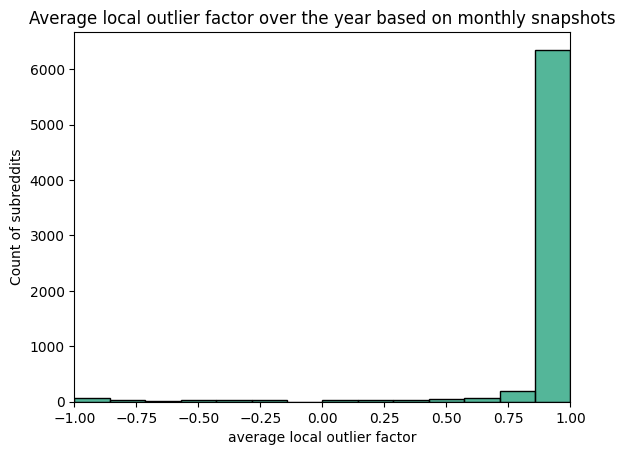

<Figure size 640x480 with 0 Axes>

In [21]:
ax = sns.histplot(data=lof_tracking_df, x=lof_avg_col)
ax.set(ylabel="Count of subreddits", title = f"Average local outlier factor over the year based on monthly snapshots")
plt.xlim(-1, 1)
plt.show()
plt.clf()

In [22]:
# Is there an associate between a subreddit typically being an outlier with its nearest neighbors changing frequently? 
lof_jaccard_df = pd.merge(lof_tracking_df, jaccard_similarity_tracking_df, on="subreddit", how="left")
print(lof_jaccard_df.shape)
display(lof_jaccard_df)

(6950, 62)


,subreddit,2021-04 local outlier factor_x,2021-05 local outlier factor_x,2021-06 local outlier factor_x,2021-07 local outlier factor_x,2021-08 local outlier factor_x,2021-09 local outlier factor_x,2021-10 local outlier factor_x,2021-11 local outlier factor_x,2021-12 local outlier factor_x,...,2022-02 20 nearest subreddits,2022-02 local outlier factor_y,2022-02 vs 2022-01 Jaccard Similiarity,2022-02 vs 2022-01 avg Local Outlier Factor,2022-03 20 nearest subreddits,2022-03 local outlier factor_y,2022-03 vs 2022-02 Jaccard Similiarity,2022-03 vs 2022-02 avg Local Outlier Factor,Jaccard Similarity between 20 nearest neighbors of adjacent months averaged over the year,stddev Jaccard Similarity between adjacent months over the year
0,smokingfetish,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,"{Fat_Fetish, EraserNipples, OutdoorRecreation,...",-1,0.111111,-1.0,"{PunkGirls, HotwifeSwingers, 40plusGoneWild, c...",-1,0.081081,-1.0,0.135763,0.047657
1,ILoveMyReplika,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,"{InfluencergossipDK, hogwartswerewolvesB, Divi...",-1,0.081081,-1.0,"{InfluencergossipDK, Pocket7Games, TheSantaAna...",-1,0.111111,-1.0,0.075475,0.052737
2,CalgaryGoneWildAgain,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,"{boobs, WetPussys, CutCocks, cockheadlovers, D...",-1,0.176471,-1.0,"{HugeDildos, couplesgonewild, DaughterTraining...",-1,0.176471,-1.0,0.156471,0.045217
3,nudism,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,"{ArtGW, LatinoCock, jockstraps, DirtyConfessio...",-1,0.212121,-1.0,"{ratemycock, BonersInPublic, Bisexy, shaveddic...",-1,0.212121,-1.0,0.242284,0.062539
4,NYr4r,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,"{GaybrosGoneWild, collegeboys, GayKik, ladybon...",-1,0.000000,-1.0,"{NYStateOfMind, Blacktittyworld, Sissydating, ...",-1,0.000000,-1.0,0.009324,0.012937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6945,ColoradoAvalanche,1,1,1,1,1,1,1,1,1,...,"{denvernuggets, fantasyhockey, CalgaryFlames, ...",1,0.379310,1.0,"{Colorado, wildhockey, denvernuggets, hockeygo...",1,0.333333,1.0,0.383305,0.079136
6946,blender,1,1,1,1,1,1,1,1,1,...,"{indiegames, 3Dmodeling, generative, godot, bl...",1,0.481481,1.0,"{ScrapMechanic, 3Dmodeling, Minecraft, generat...",1,0.428571,1.0,0.531846,0.083708
6947,cinematography,1,1,1,1,1,1,1,1,1,...,"{Cameras, Moviesinthemaking, davinciresolve, v...",1,0.600000,1.0,"{Cameras, filmphotography, photocritique, Anal...",1,0.600000,1.0,0.578969,0.057635
6948,worldofpvp,1,1,1,1,1,1,1,1,1,...,"{Transmogrification, classicwowtbc, Diablo, Li...",1,0.428571,1.0,"{Transmogrification, classicwowtbc, Destiny, h...",1,0.481481,1.0,0.571380,0.099271


In [23]:
fig = px.scatter(lof_jaccard_df, x=js_avg_col, y=lof_avg_col, hover_data=["subreddit"])
fig.show()


# Nearest Neighbors of Subreddits over Time 

In order to build the community2vec models, we kept the top 10K subreddits in each month by number of comments posted. In the community2vec model of a given month, you can retrieve the set of any number of nearest neighbors for a particular subreddit, then compare how that set changes from one month to the next. The change in sets of nearest neighbors can be measured using the [Jaccard Similarity](https://en.wikipedia.org/wiki/Jaccard_index) of the top subreddits between each month. Let $S_1$ and $S_2$ be the top 10K subreddits for months 1 and 2 respectively, then the similarity and diversity of top subreddits between those months is $\frac{|S_1 \cap S_2|}{|S_1 \cup S_2|}$.
The closer to 1 the values are, the more similar the nearest neighbors are between those two months. 

10 nearest neighbors of r/trans


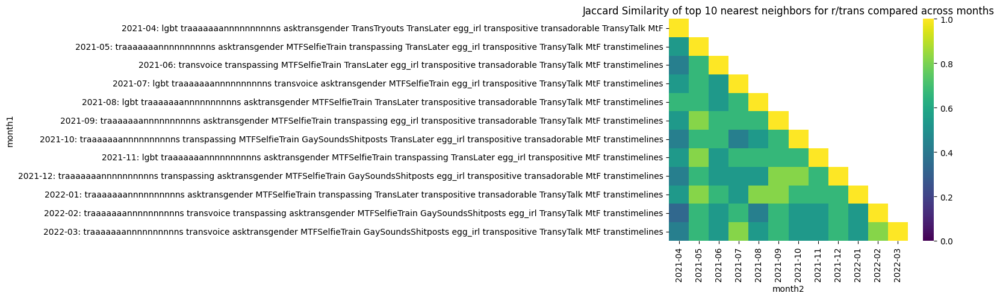

10 nearest neighbors of r/antiwork


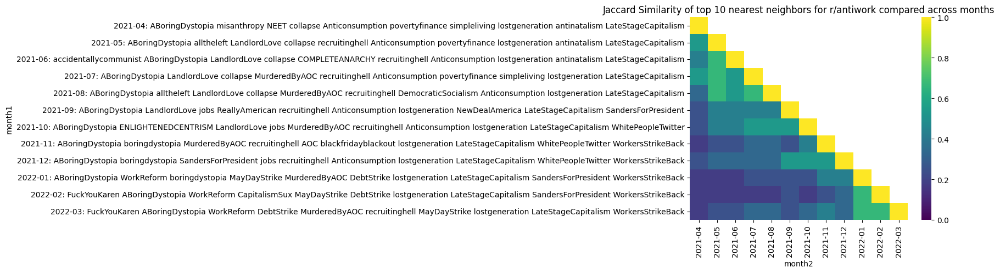

10 nearest neighbors of r/WorkReform


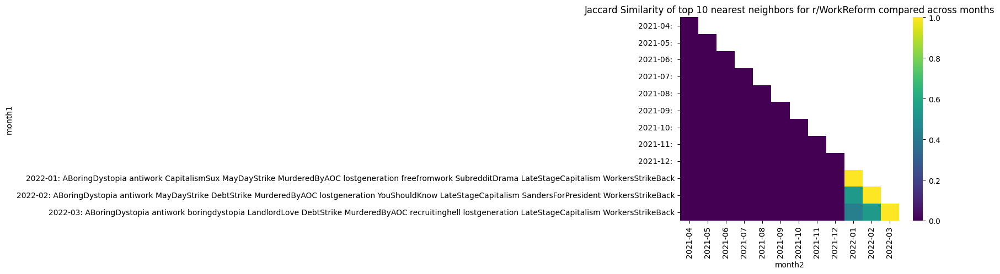

10 nearest neighbors of r/AskReddit


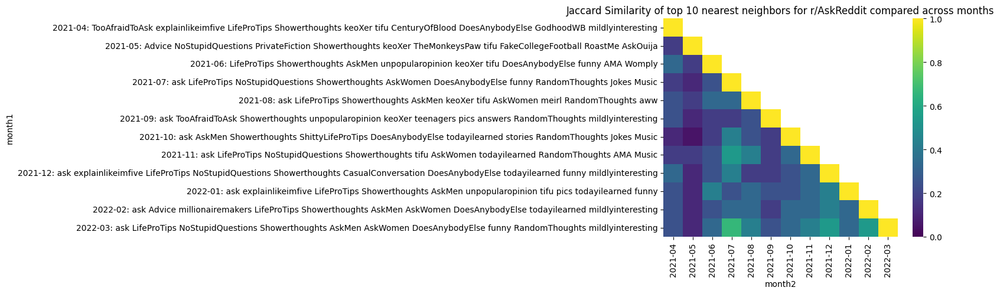

10 nearest neighbors of r/IdiotsInCars


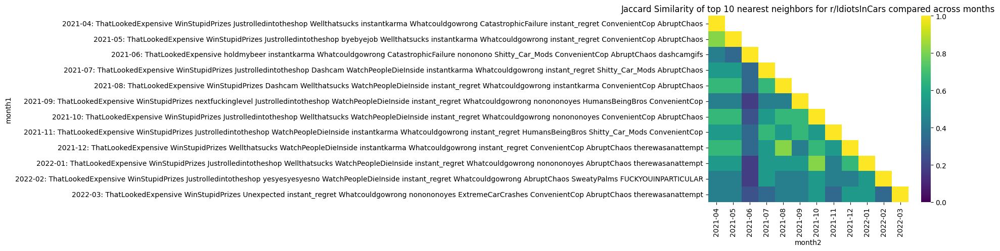

10 nearest neighbors of r/wallstreetbets


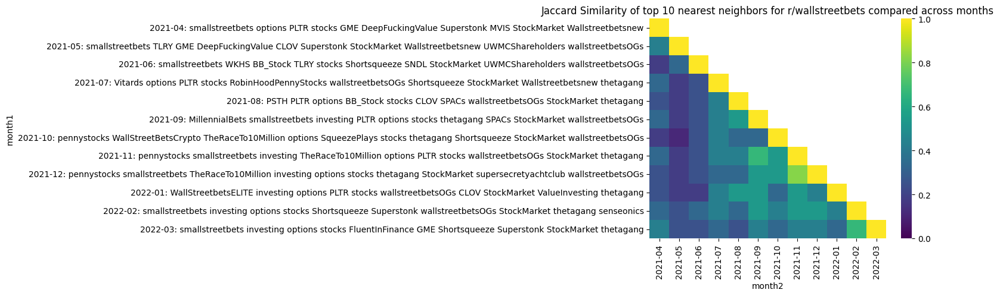

10 nearest neighbors of r/vaxxhappened


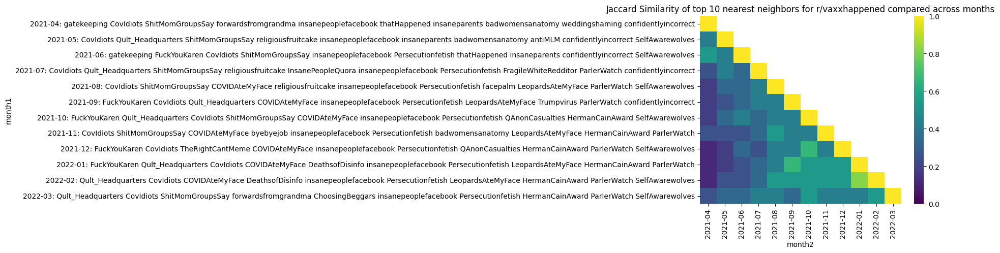

10 nearest neighbors of r/PublicFreakout


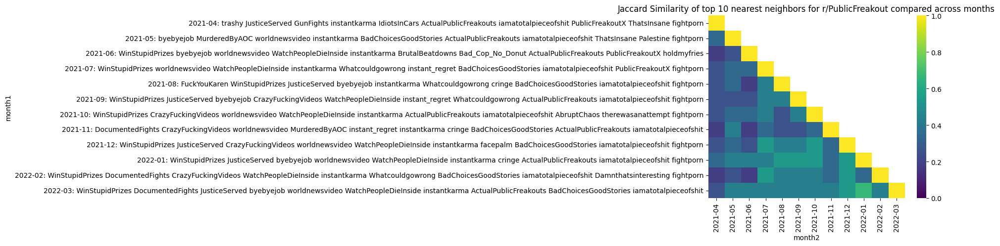

10 nearest neighbors of r/ActualPublicFreakouts


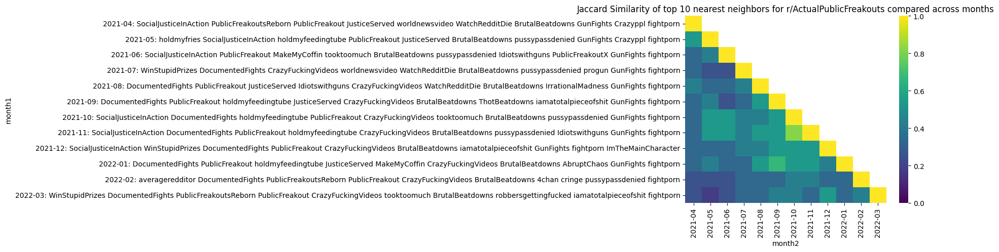

10 nearest neighbors of r/TheRedPill


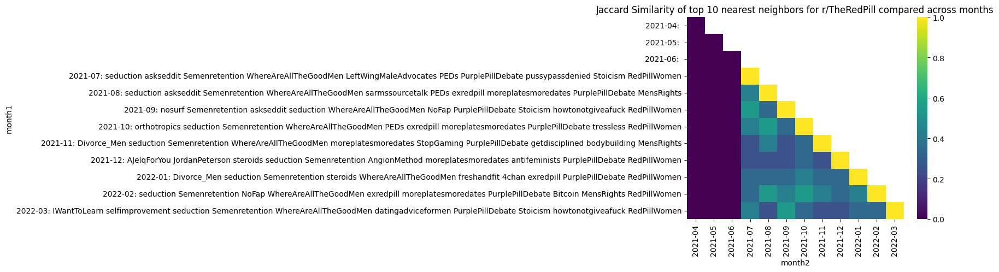

10 nearest neighbors of r/dating_advice


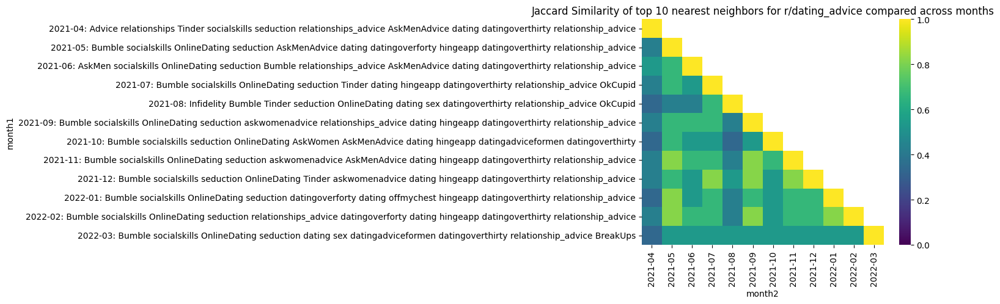

10 nearest neighbors of r/democrats


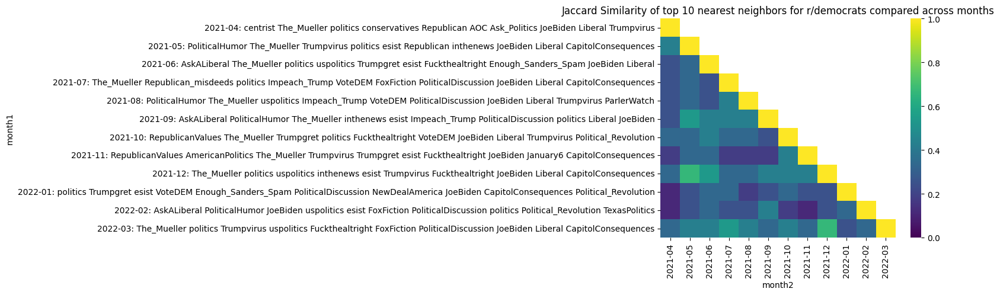

10 nearest neighbors of r/Conservative


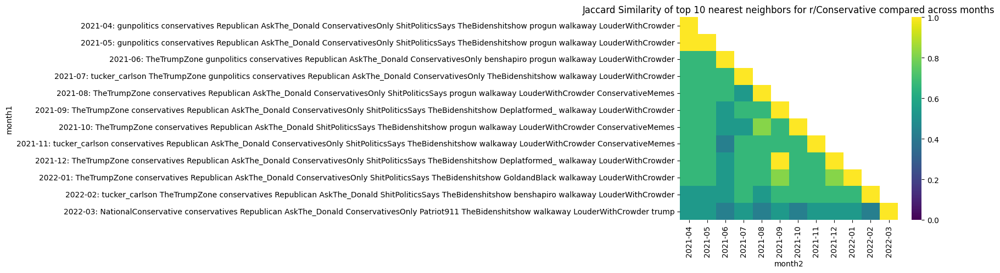

10 nearest neighbors of r/conservatives


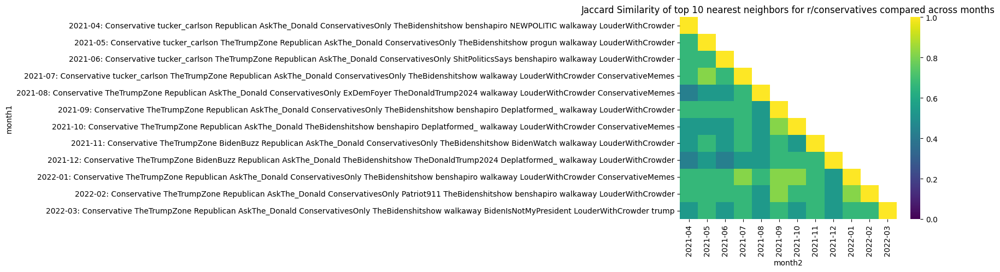

10 nearest neighbors of r/AskThe_Donald


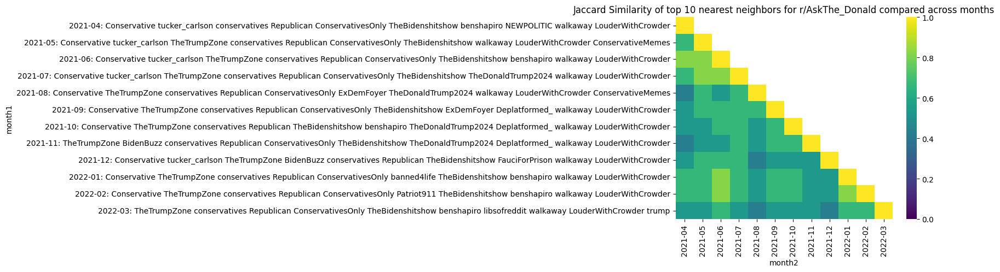

10 nearest neighbors of r/running


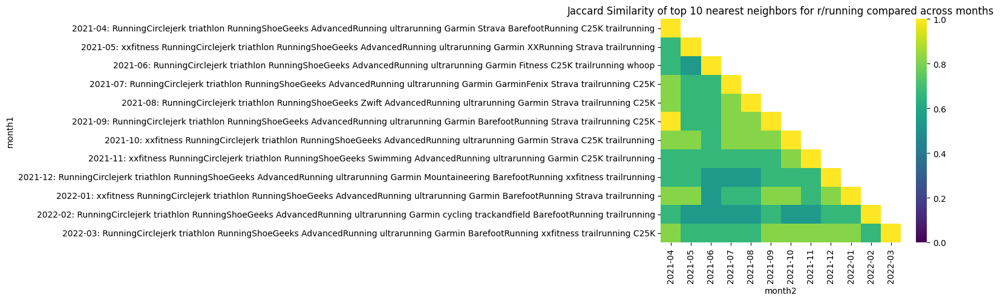

10 nearest neighbors of r/teenagers


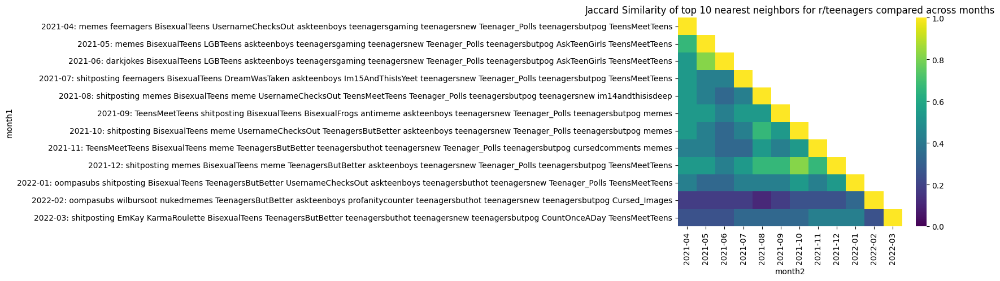

10 nearest neighbors of r/LeopardsAteMyFace


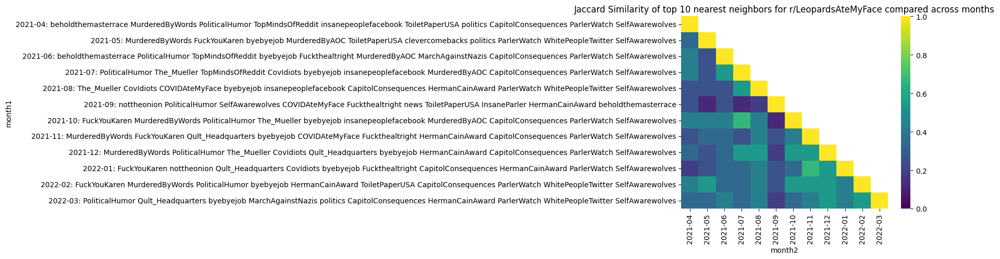

10 nearest neighbors of r/GME


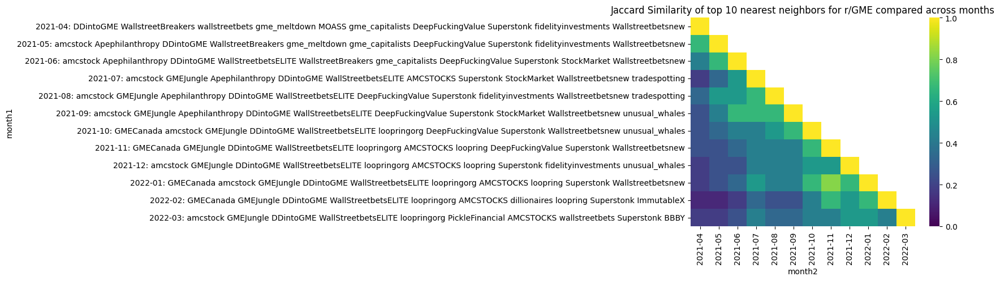

10 nearest neighbors of r/de


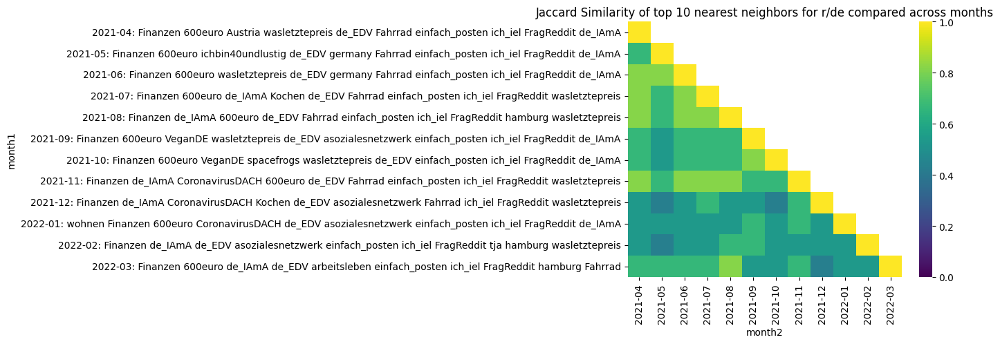

10 nearest neighbors of r/brasil


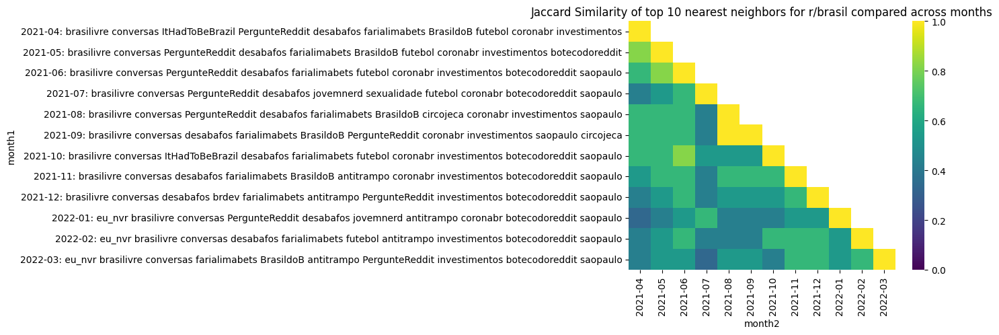

10 nearest neighbors of r/portugueses


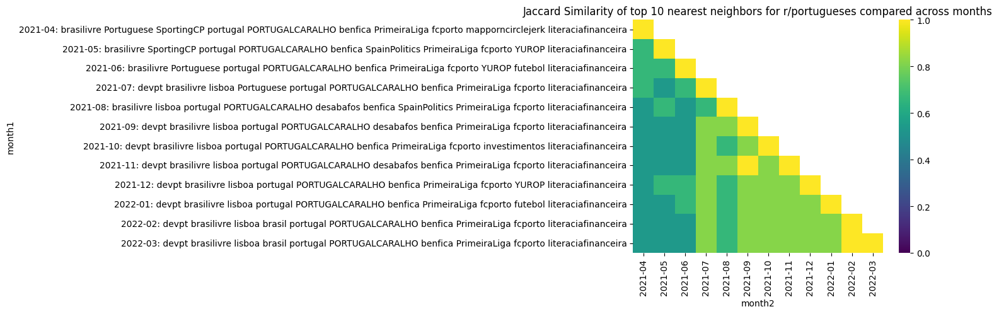

10 nearest neighbors of r/TheGamerLounge


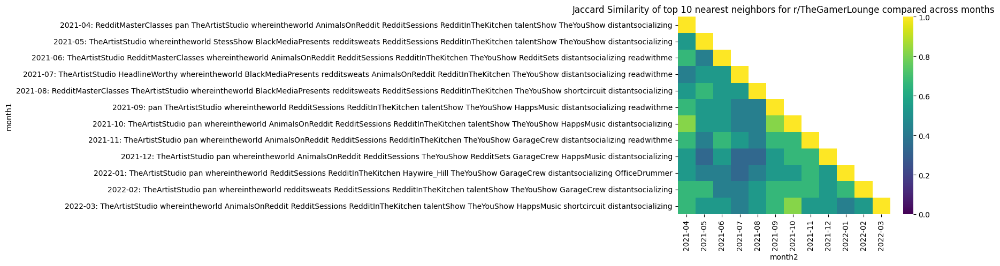

10 nearest neighbors of r/TheYouShow


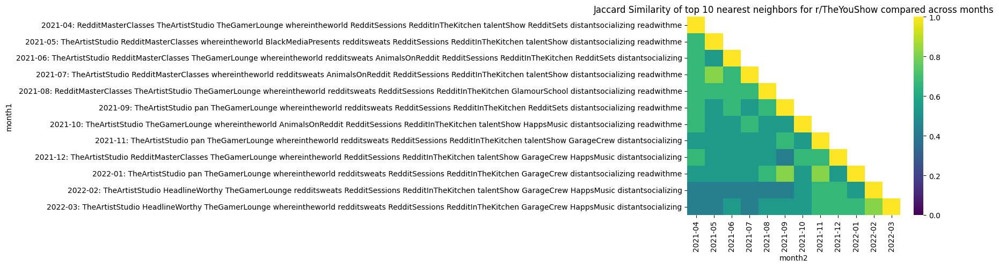

20 nearest neighbors of r/trans


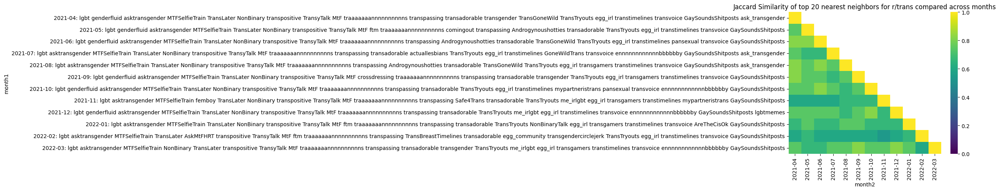

20 nearest neighbors of r/antiwork


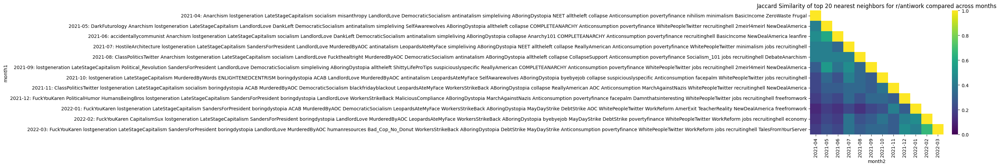

20 nearest neighbors of r/WorkReform


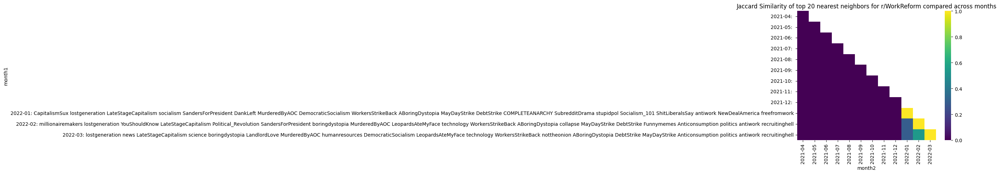

20 nearest neighbors of r/AskReddit


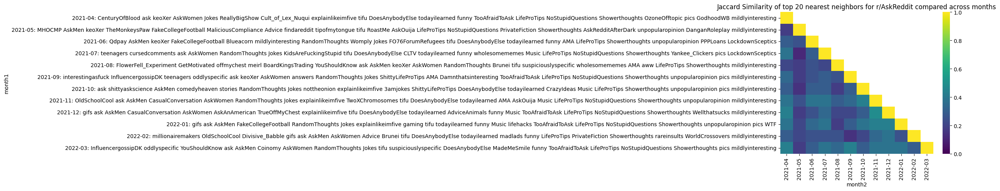

20 nearest neighbors of r/IdiotsInCars


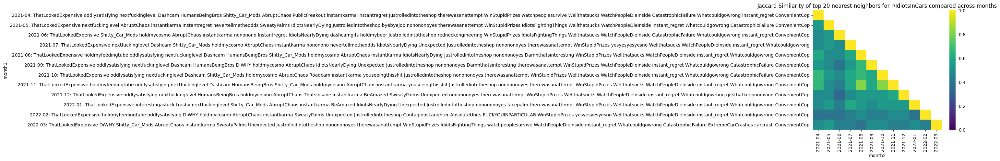

20 nearest neighbors of r/wallstreetbets


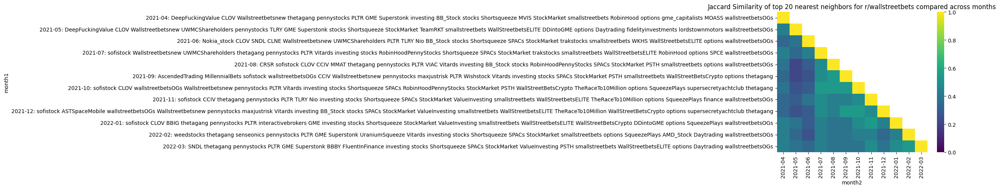

20 nearest neighbors of r/vaxxhappened


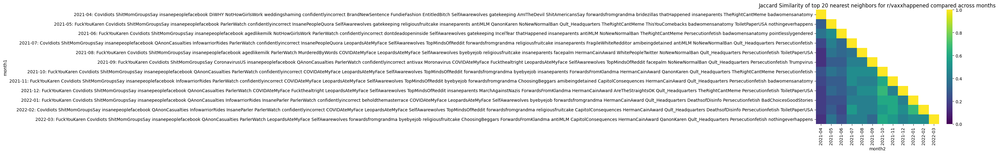

20 nearest neighbors of r/PublicFreakout


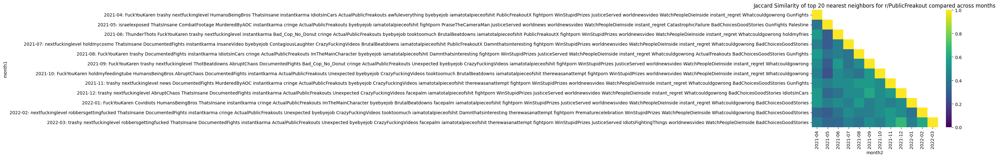

20 nearest neighbors of r/ActualPublicFreakouts


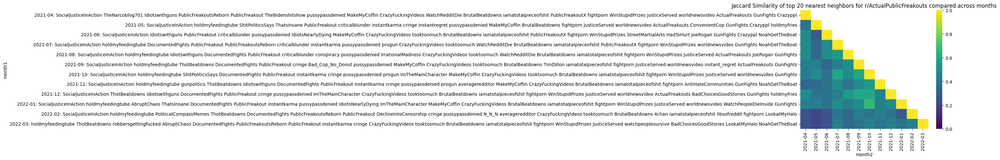

20 nearest neighbors of r/TheRedPill


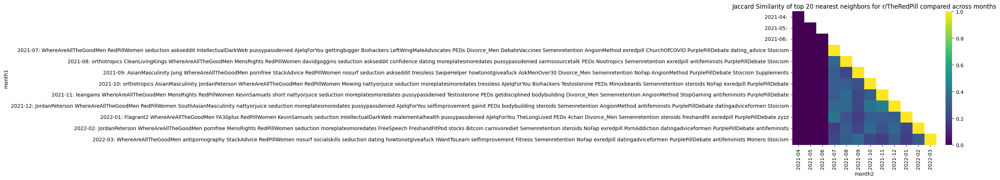

20 nearest neighbors of r/dating_advice


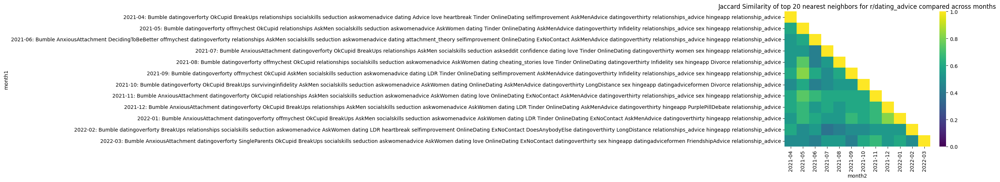

20 nearest neighbors of r/democrats


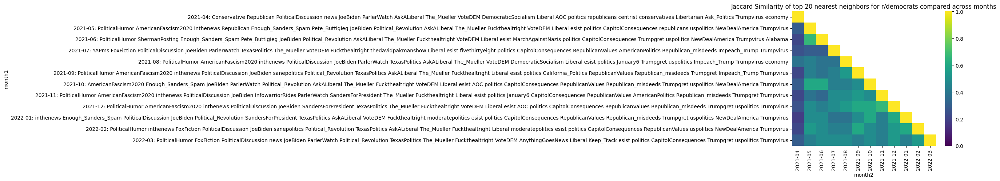

20 nearest neighbors of r/Conservative


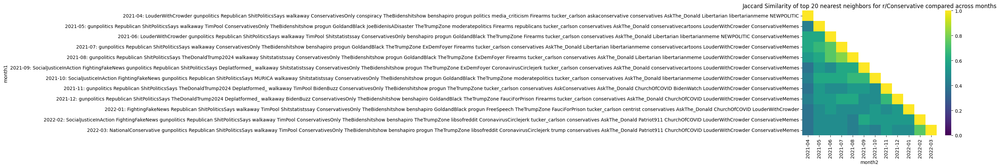

20 nearest neighbors of r/conservatives


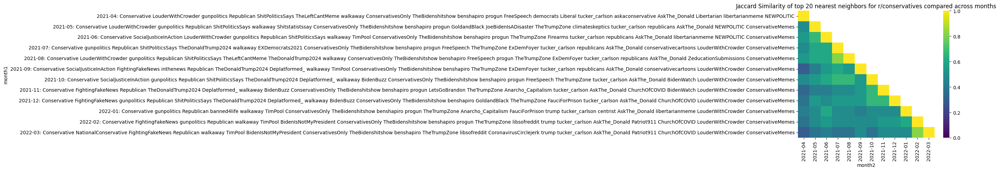

20 nearest neighbors of r/AskThe_Donald


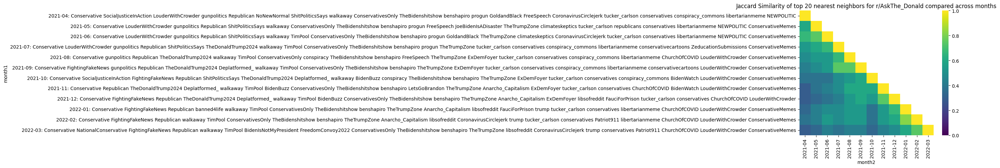

20 nearest neighbors of r/running


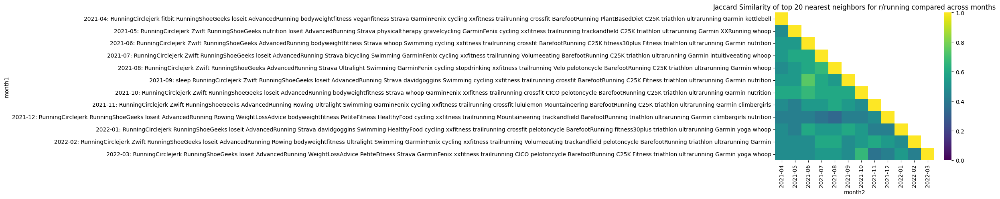

20 nearest neighbors of r/teenagers


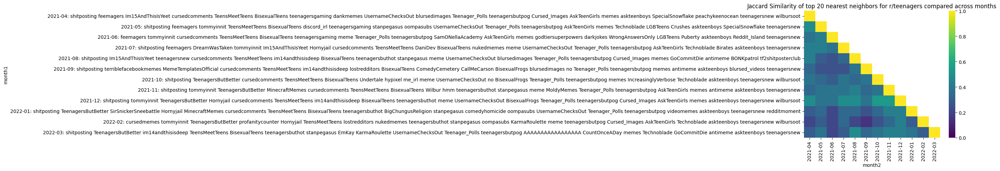

20 nearest neighbors of r/LeopardsAteMyFace


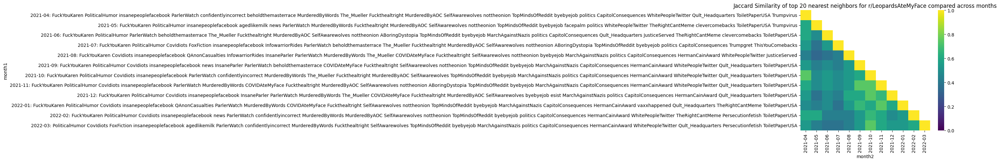

20 nearest neighbors of r/GME


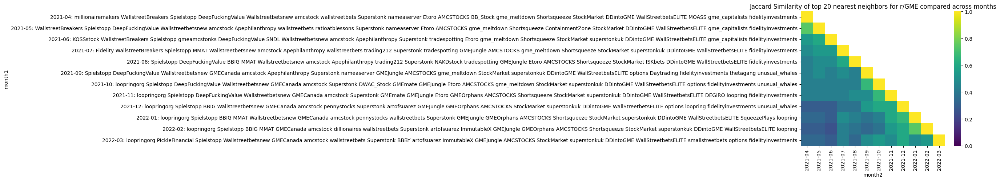

20 nearest neighbors of r/de


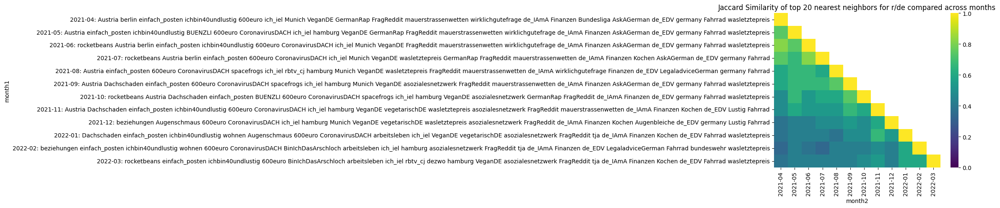

20 nearest neighbors of r/brasil


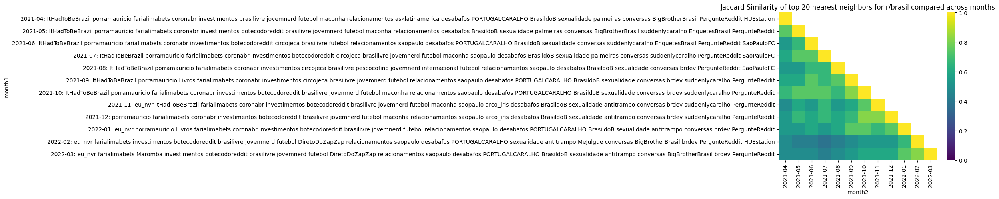

20 nearest neighbors of r/portugueses


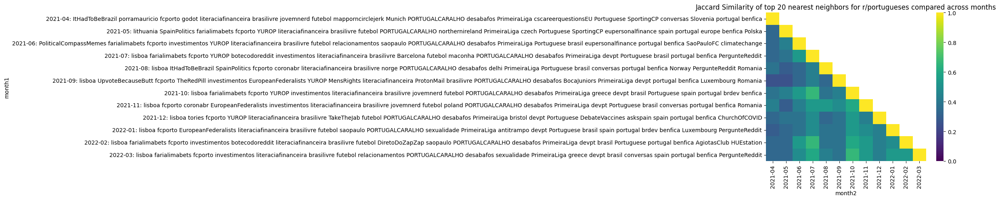

20 nearest neighbors of r/TheGamerLounge


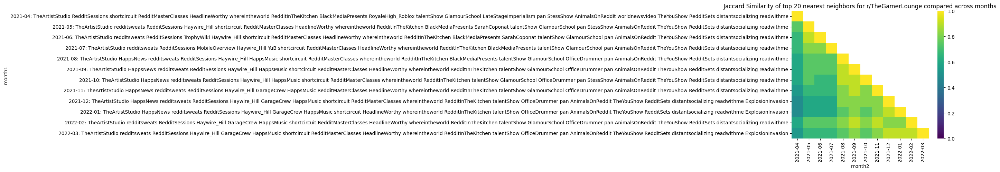

20 nearest neighbors of r/TheYouShow


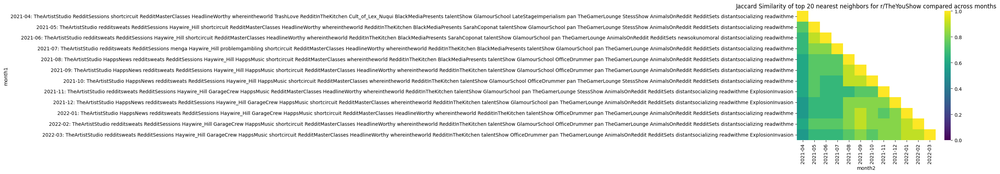

<Figure size 640x480 with 0 Axes>

In [24]:


# Let's look at some specific subreddits
interesting_subreddits = ["trans", "antiwork", "WorkReform", "AskReddit", "IdiotsInCars", "wallstreetbets", "vaxxhappened", "PublicFreakout", "ActualPublicFreakouts", "TheRedPill", "dating_advice", "democrats", "Conservative", "conservatives", "AskThe_Donald", "running", "teenagers", "LeopardsAteMyFace", "GME", "de", "brasil", "portugueses", "TheGamerLounge", "TheYouShow"]


for n in [10, 20]:
    for subreddit in interesting_subreddits:
        subreddit_comp_results = list()
        print(f"{n} nearest neighbors of r/{subreddit}")
        tick_labels = list()
        for i, month1_label in enumerate(MONTHS):
            c2v_model = C2V_MODELS[i]
            topn_nn = set(c2v_model.get_nearest_neighbors(subreddit, n))
            subreddit_comp_results.append((month1_label, topn_nn))
            tick_labels.append(month1_label + ": " + " ".join(topn_nn))

        subreddit_comp_df = pd.DataFrame.from_records(subreddit_comp_results, columns=["month1", "month1_subreddits"])
        subreddit_comp_df_right = subreddit_comp_df.copy().rename(columns={"month1": "month2", "month1_subreddits": "month2_subreddits"})
        merged = pd.merge(subreddit_comp_df, subreddit_comp_df_right, how="cross")
        
        merged["jaccard_similarity"] = merged.apply(lambda x: get_jaccard_similarity(x["month1_subreddits"], x["month2_subreddits"]), axis=1)
        pivot_table = merged.pivot(index = "month1", columns = "month2", values = "jaccard_similarity")
        mask = np.triu(np.ones_like(pivot_table, dtype=bool), 1)
        heatmap = sns.heatmap(pivot_table, vmin=0, vmax=1, yticklabels= tick_labels, mask = mask, cmap="viridis").set_title(f"Jaccard Similarity of top {n} nearest neighbors for r/{subreddit} compared across months")
        fig = heatmap.get_figure()
        plt.show()
        fig.savefig(VIZ_PATH / f"{n}_{subreddit}.png", bbox_inches="tight")
        plt.clf()


        